## Author : Dimgba Martha Otisi
### @martha_samuel_

### score = 0.8308659

In [2]:
import pandas as pd
pd.set_option('display.max_columns', None)
import numpy as np
from sklearn import preprocessing
from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import roc_curve, roc_auc_score, log_loss
from sklearn.metrics import classification_report
from sklearn.ensemble import GradientBoostingClassifier
from matplotlib import pyplot
import pickle
import matplotlib.pyplot as plt
import seaborn as sns
import xgboost as xgb
from xgboost import XGBClassifier
import catboost 
from catboost import CatBoostClassifier
import lightgbm as lgb
from lightgbm import LGBMClassifier
from sklearn.metrics import mean_squared_error
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.feature_selection import RFE, RFECV
from sklearn.model_selection import cross_val_score, KFold

In [3]:
df= pd.read_csv('Train1.csv')
df_Test = pd.read_csv('Test1.csv')
#print(df.head(3))
df_sample=pd.read_csv("SampleSubmission1.csv")


In [4]:
df_user = df.pop('Applicant_ID')
df_Test_user =df_Test.pop('Applicant_ID')


In [5]:
# combine both test and train to 
df_Test['default_status']=-1

data = pd.concat((df, df_Test)).reset_index(drop=True)
print(df.shape, df_Test.shape, data.shape)
#data.head()

(56000, 51) (24000, 51) (80000, 51)


In [6]:
#mapping and converting categoricals 
data['form_field47']= data['form_field47'].map({'charge':0, 'lending':1}, na_action= 'ignore')

data['default_status']= data['default_status'].map({'yes':1, 'no':0}, na_action= 'ignore')


In [7]:
np.all(np.isfinite(data))#this shows there is infinity

False

In [7]:
data.columns

Index(['form_field1', 'form_field2', 'form_field3', 'form_field4',
       'form_field5', 'form_field6', 'form_field7', 'form_field8',
       'form_field9', 'form_field10', 'form_field11', 'form_field12',
       'form_field13', 'form_field14', 'form_field15', 'form_field16',
       'form_field17', 'form_field18', 'form_field19', 'form_field20',
       'form_field21', 'form_field22', 'form_field23', 'form_field24',
       'form_field25', 'form_field26', 'form_field27', 'form_field28',
       'form_field29', 'form_field30', 'form_field31', 'form_field32',
       'form_field33', 'form_field34', 'form_field35', 'form_field36',
       'form_field37', 'form_field38', 'form_field39', 'form_field40',
       'form_field41', 'form_field42', 'form_field43', 'form_field44',
       'form_field45', 'form_field46', 'form_field47', 'form_field48',
       'form_field49', 'form_field50', 'default_status'],
      dtype='object')

### feature engineering


In [7]:
data.form_field17=data.form_field17.combine_first(data.form_field18)#it takes values from 18
#print(df.form_field18)
data.form_field17.isna().sum()
#df['form_field17'].fillna(method='backfill', inplace=True, axis=1)#takes values from wherever
#print(df['form_field17'])




14771

In [8]:
#data['form_field18'].fillna(method='ffill', inplace=True)#takes values from wherever
#print(data['form_field18'])  

data.form_field18=data.form_field18.combine_first(data.form_field17)#it takes values from 17
#print(data.form_field18)
data.form_field18.isna().sum()
#or data.form_field18=data.form_field18.fillna(data.form_field17)
#print(sum(data.form_field18))
#print(data.form_field18)



14771

In [9]:
data.form_field20=data.form_field20.combine_first(data.form_field19)#it takes values from 19
#print(data_Test.form_field20)
data.form_field20.isna().sum()

#df['form_field20'].fillna(method='ffill', inplace=True, axis=1)# fills from wherever
#print(df['form_field20'])



4

In [10]:
data.form_field19=data.form_field19.combine_first(data.form_field20)#it takes values from 20
#print(data.form_field18)
data.form_field19.isna().sum()
#['form_field19'].fillna(method='backfill', inplace=True, axis=1)  # fills from wherever
#print(data['form_field19']) or print(data.form_field19)



4

In [12]:
# Function to calculate missing values by column# Funct 
def missing_values_table(df):
        # Total missing values
        mis_val = data.isnull().sum()
        
        # Percentage of missing values
        mis_val_percent = 100 * data.isnull().sum() / len(data)
        
        # Make a table with the results
        mis_val_table = pd.concat([mis_val, mis_val_percent], axis=1)
        
        # Rename the columns
        mis_val_table_ren_columns = mis_val_table.rename(
        columns = {0 : 'Missing Values', 1 : '% of Total Values'})
        
        # Sort the table by percentage of missing descending
        mis_val_table_ren_columns = mis_val_table_ren_columns[
            mis_val_table_ren_columns.iloc[:,1] != 0].sort_values(
        '% of Total Values', ascending=False).round(1)
        
        # Print some summary information
        print ("Your selected dataframe has " + str(data.shape[1]) + " columns.\n"      
            "There are " + str(mis_val_table_ren_columns.shape[0]) +
              " columns that have missing values.")
        
        # Return the dataframe with missing information
        return mis_val_table_ren_columns


In [13]:
# Missing values statistics
missing_values = missing_values_table(data)
missing_values.head(20)

Your selected dataframe has 51 columns.
There are 49 columns that have missing values.


,Missing Values,% of Total Values
form_field40,62557,78.2
form_field31,56218,70.3
form_field41,54578,68.2
form_field45,44855,56.1
form_field11,44819,56.0
form_field23,40248,50.3
form_field30,36417,45.5
form_field35,33014,41.3
form_field15,32067,40.1
form_field48,29811,37.3


In [11]:
data=data.drop(['form_field40'],axis=1)# at here,with feat.eng with -1=0.8305257. highest so far. MowopeMart1rf-1_ = MowopeMart1rf-1__

In [12]:
# this replaces Nan with -1
data=data.fillna(-1)

In [13]:
dd=data.copy()
dd.drop('default_status', axis=1, inplace=True)

ddc = dd.copy()

dd.shape,ddc.shape


((80000, 49), (80000, 49))

In [17]:
#Checking for multi colinearity
vif = pd.DataFrame()
vif["VIF Factor"] = [variance_inflation_factor(dd.values, i) for i in range(dd.shape[1])]
vif["features"] = dd.columns
vif

,VIF Factor,features
0,18.132018,form_field1
1,1.557357,form_field2
2,4.164376,form_field3
3,2.111360,form_field4
4,3.981984,form_field5
5,1.792006,form_field6
6,6.989152,form_field7
7,3.200137,form_field8
8,4.600650,form_field9
9,9.965872,form_field10


In [18]:
#Scaling/normalizing the dataset
dd = StandardScaler().fit_transform(dd)

In [19]:
#Checking for multi colinearity
vif = pd.DataFrame()
vif["VIF Factor"] = [variance_inflation_factor(dd, i) for i in range(dd.shape[1])]
vif["features"] = ddc.columns
vif

,VIF Factor,features
0,1.763192,form_field1
1,1.248070,form_field2
2,3.378051,form_field3
3,2.029877,form_field4
4,3.848713,form_field5
5,1.575456,form_field6
6,6.211788,form_field7
7,2.446061,form_field8
8,3.458810,form_field9
9,8.274333,form_field10


In [23]:
#visualizing


corr=ddc.corr()
corr.style.background_gradient(cmap='coolwarm')

In [14]:
data['form_field17_19'] = data['form_field17'] + data['form_field19'] 
data =data.drop(['form_field17','form_field19'],axis=1)

In [15]:
data['form_field18_20'] = (data['form_field18'] + data['form_field20'])
data=data.drop(['form_field18','form_field20'],axis=1)

In [16]:
data['form_field1719_1820'] = (data['form_field17_19'] + data['form_field18_20'])
data=data.drop(['form_field17_19','form_field18_20'],axis=1)

In [17]:
data['form_field32_37'] = (data['form_field32'] + data['form_field37'])
data=data.drop(['form_field32','form_field37'],axis=1)

In [18]:
data['form_field4_46'] = data['form_field4'] + data['form_field46']
data=data.drop(['form_field4','form_field46'],axis=1)

In [19]:
data['form_field1_28'] = data['form_field1'] + data['form_field28']
data =data.drop(['form_field1','form_field28'],axis=1)

In [20]:
data['form_field26_27'] = (data['form_field26'] +  data['form_field27'])
data=data.drop(['form_field26','form_field27'],axis=1)

In [21]:
data['form_field7_10'] = (data['form_field7'] + data['form_field10'])
data=data.drop(['form_field7','form_field10'],axis=1)

In [22]:
data['form_field25_29'] = (data['form_field25'] + data['form_field29'])
data=data.drop(['form_field25','form_field29'],axis=1)

In [23]:
data=data.drop(['form_field1719_1820'],axis=1) # at thisnew point,missing is -1 =0.829, 0 as ,0=0.826

In [24]:
data=data.replace([np.inf, -np.inf], np.nan)

data=data.fillna(-1)

In [25]:
print(data.shape)
data.head(1)
data.columns

(80000, 40)


Index(['form_field2', 'form_field3', 'form_field5', 'form_field6',
       'form_field8', 'form_field9', 'form_field11', 'form_field12',
       'form_field13', 'form_field14', 'form_field15', 'form_field16',
       'form_field21', 'form_field22', 'form_field23', 'form_field24',
       'form_field30', 'form_field31', 'form_field33', 'form_field34',
       'form_field35', 'form_field36', 'form_field38', 'form_field39',
       'form_field41', 'form_field42', 'form_field43', 'form_field44',
       'form_field45', 'form_field47', 'form_field48', 'form_field49',
       'form_field50', 'default_status', 'form_field32_37', 'form_field4_46',
       'form_field1_28', 'form_field26_27', 'form_field7_10',
       'form_field25_29'],
      dtype='object')

In [32]:
#visualizing


corr=data.corr()
corr.style.background_gradient(cmap='coolwarm')

In [26]:
sns.pairplot(data)

### model

In [26]:

X=data[:df.shape[0]]
X.drop('default_status', axis=1, inplace=True)
X = StandardScaler().fit_transform(X)

y = data.default_status[:df.shape[0]].copy()#map({'yes':1, 'no':0}, na_action= 'ignore')


print(len(X),len(y))
print(X.shape[1])#the no of columns
#print(y.tail())
#print(X.head())

56000 56000
39


/home/martha/anaconda3/lib/python3.7/site-packages/pandas/core/frame.py:3997: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


In [27]:
x=data[df.shape[0]:].astype(float)
x.drop('default_status', axis=1,inplace=True)
x = StandardScaler().fit_transform(x)
print(len(x))

24000


In [35]:
#Split the data into 80% training and 20% testing
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size =0.2, random_state = 0)

In [ ]:
# this and the next 7 cells were run in colab

pip install scikit-optimize


Collecting scikit-optimize
  Downloading https://files.pythonhosted.org/packages/8b/03/be33e89f55866065a02e515c5b319304a801a9f1027a9b311a9b1d1f8dc7/scikit_optimize-0.8.1-py2.py3-none-any.whl (101kB)
     |████████████████████████████████| 102kB 662kB/s 
Requirement already satisfied: numpy>=1.13.3 in /usr/local/lib/python3.6/dist-packages (from scikit-optimize) (1.18.5)
Requirement already satisfied: scikit-learn>=0.20.0 in /usr/local/lib/python3.6/dist-packages (from scikit-optimize) (0.22.2.post1)
Collecting pyaml>=16.9
  Downloading https://files.pythonhosted.org/packages/15/c4/1310a054d33abc318426a956e7d6df0df76a6ddfa9c66f6310274fb75d42/pyaml-20.4.0-py2.py3-none-any.whl
Requirement already satisfied: scipy>=0.19.1 in /usr/local/lib/python3.6/dist-packages (from scikit-optimize) (1.4.1)
Requirement already satisfied: joblib>=0.11 in /usr/local/lib/python3.6/dist-packages (from scikit-optimize) (0.16.0)
Requirement already satisfied: PyYAML in /usr/local/lib/python3.6/dist-packages (from pyaml>=16.9->scikit-optimize) (3.13)
Installing collected packages: pyaml, scikit-optimize
Successfully installed pyaml-20.4.0 scikit-optimize-0.8.1

In [ ]:
pip install shap

Collecting shap
  Downloading https://files.pythonhosted.org/packages/d2/17/37ee6c79cafbd9bb7423b54e55ea90beec66aa7638664d607bcc28de0bae/shap-0.36.0.tar.gz (319kB)
     |████████████████████████████████| 327kB 2.6MB/s 
Requirement already satisfied: numpy in /usr/local/lib/python3.6/dist-packages (from shap) (1.18.5)
Requirement already satisfied: scipy in /usr/local/lib/python3.6/dist-packages (from shap) (1.4.1)
Requirement already satisfied: scikit-learn in /usr/local/lib/python3.6/dist-packages (from shap) (0.22.2.post1)
Requirement already satisfied: pandas in /usr/local/lib/python3.6/dist-packages (from shap) (1.1.2)
Requirement already satisfied: tqdm>4.25.0 in /usr/local/lib/python3.6/dist-packages (from shap) (4.41.1)
Collecting slicer
  Downloading https://files.pythonhosted.org/packages/46/cf/f37ac7f61214ed044b0df91252ab19376de5587926c5b572f060eb7bf257/slicer-0.0.4-py3-none-any.whl
Requirement already satisfied: numba in /usr/local/lib/python3.6/dist-packages (from shap) (0.48.0)
Requirement already satisfied: joblib>=0.11 in /usr/local/lib/python3.6/dist-packages (from scikit-learn->shap) (0.16.0)
Requirement already satisfied: pytz>=2017.2 in /usr/local/lib/python3.6/dist-packages (from pandas->shap) (2018.9)
Requirement already satisfied: python-dateutil>=2.7.3 in /usr/local/lib/python3.6/dist-packages (from pandas->shap) (2.8.1)
Requirement already satisfied: llvmlite<0.32.0,>=0.31.0dev0 in /usr/local/lib/python3.6/dist-packages (from numba->shap) (0.31.0)
Requirement already satisfied: setuptools in /usr/local/lib/python3.6/dist-packages (from numba->shap) (50.3.0)
Requirement already satisfied: six>=1.5 in /usr/local/lib/python3.6/dist-packages (from python-dateutil>=2.7.3->pandas->shap) (1.15.0)
Building wheels for collected packages: shap
  Building wheel for shap (setup.py) ... done
  Created wheel for shap: filename=shap-0.36.0-cp36-cp36m-linux_x86_64.whl size=456466 sha256=54c463fb2ccd2e6e5ac530cc9b78a9bff1f09ba7cded994effeca711399f743e
  Stored in directory: /root/.cache/pip/wheels/fb/15/e1/8f61106790da27e0765aaa6e664550ca2c50ea339099e799f4
Successfully built shap
Installing collected packages: slicer, shap
Successfully installed shap-0.36.0 slicer-0.0.4

In [43]:
from skopt import gp_minimize
from skopt.space import Real, Integer
from skopt.utils import use_named_args
from skopt.plots import plot_convergence
from copy import deepcopy
import pprint
import shap
pp = pprint.PrettyPrinter(indent=4)
#% matplotlib inline

In [42]:
class ModelOptimizer:
    best_score = None
    opt = None
    
    def __init__(self, model, X_train, y_train, categorical_columns_indices=None, n_fold=3, seed=2405, early_stopping_rounds=30, is_stratified=True, is_shuffle=True):
        self.model = model
        self.X_train = X_train
        self.y_train = y_train
        self.categorical_columns_indices = categorical_columns_indices
        self.n_fold = n_fold
        self.seed = seed
        self.early_stopping_rounds = early_stopping_rounds
        self.is_stratified = is_stratified
        self.is_shuffle = is_shuffle
        
        
    def update_model(self, **kwargs):
        for k, v in kwargs.items():
            setattr(self.model, k, v)
            
    def evaluate_model(self):
        pass
    
    def optimize(self, param_space, max_evals=10, n_random_starts=2):
        start_time = time.time()
        
        @use_named_args(param_space)
        def _minimize(**params):
            self.model.set_params(**params)
            return self.evaluate_model()
        
        opt = gp_minimize(_minimize, param_space, n_calls=max_evals, n_random_starts=n_random_starts, random_state=2405, n_jobs=-1)
        best_values = opt.x
        optimal_values = dict(zip([param.name for param in param_space], best_values))
        best_score = opt.fun
        self.best_score = best_score
        self.opt = opt
        
        print('optimal_parameters: {}\noptimal score: {}\noptimization time: {}'.format(optimal_values, best_score, time.time() - start_time))
        print('updating model with optimal values')
        self.update_model(**optimal_values)
        plot_convergence(opt)
        return optimal_values
 
    
class CatboostOptimizer(ModelOptimizer):
    def evaluate_model(self):
        validation_scores = catboost.cv(
        catboost.Pool(self.X_train, 
                      self.y_train, 
                      cat_features=self.categorical_columns_indices),
                      self.model.get_params(), 
                      nfold=self.n_fold,
                      stratified=self.is_stratified,
                      seed=self.seed,
                      early_stopping_rounds=self.early_stopping_rounds,
                      shuffle=self.is_shuffle,
                      plot=False)
                      
        self.scores = validation_scores
        test_scores = validation_scores.iloc[:, 1]
        best_metric = test_scores.max()
        return 1 - best_metric 
    


In [ ]:
# default param for catboost
default_cb = catboost.CatBoostClassifier(loss_function='Logloss', eval_metric='AUC', silent=True)
default_cb_optimizer = CatboostOptimizer(default_cb, X_train, y_train)
default_cb_optimizer.evaluate_model()



Stopped by overfitting detector  (30 iterations wait)
0.16170255920956234

In [ ]:
import time
#  greedy parameter tuning
cb = catboost.CatBoostClassifier(n_estimators=4000, # use large n_estimators deliberately to make use of the early stopping
                         one_hot_max_size=2,
                         loss_function='Logloss',
                         eval_metric='AUC',
                         boosting_type='Ordered', # use permutations
                         random_seed=2405, 
                         use_best_model=True,
                         silent=True)
cb_optimizer = CatboostOptimizer(cb, X_train, y_train)
params_space = [Real(0.01, 0.8, name='learning_rate'),]
cb_optimal_values = cb_optimizer.optimize(params_space)


Stopped by overfitting detector  (30 iterations wait)
Stopped by overfitting detector  (30 iterations wait)
Stopped by overfitting detector  (30 iterations wait)
Stopped by overfitting detector  (30 iterations wait)
Stopped by overfitting detector  (30 iterations wait)
The objective has been evaluated at this point before.
Stopped by overfitting detector  (30 iterations wait)
The objective has been evaluated at this point before.
Stopped by overfitting detector  (30 iterations wait)
Stopped by overfitting detector  (30 iterations wait)
The objective has been evaluated at this point before.
Stopped by overfitting detector  (30 iterations wait)
Stopped by overfitting detector  (30 iterations wait)
optimal_parameters: {'learning_rate': 0.010074100733272565}
optimal score: 0.16163254028292506
optimization time: 4692.2240607738495
updating model with optimal values


In [ ]:
params_space = [Integer(2, 10, name='max_depth'),]
cb_optimal_values = cb_optimizer.optimize(params_space)


Stopped by overfitting detector  (30 iterations wait)
Stopped by overfitting detector  (30 iterations wait)
The objective has been evaluated at this point before.
Stopped by overfitting detector  (30 iterations wait)
The objective has been evaluated at this point before.
Stopped by overfitting detector  (30 iterations wait)
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
Stopped by overfitting detector  (30 iterations wait)
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
Stopped by overfitting detector  (30 iterations wait)
The objective has been evaluated at this point before.
optimal_parameters: {'max_depth': 10}
optimal score: 0.16150794977413196
optimization time: 22162.268199443817
updating model with optimal values


In [ ]:
params_space = [
                Real(0.5, 1.0, name='colsample_bylevel'), 
                Real(0.0, 100, name='bagging_temperature'),]
cb_optimal_values = cb_optimizer.optimize(params_space)

Stopped by overfitting detector  (30 iterations wait)
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
optimal_parameters: {'colsample_bylevel': 0.5, 'bagging_temperature': 100.0}
optimal score: 0.1632450618509852
optimization time: 7268.540562152863
updating model with optimal values

In [44]:
ctb = CatBoostClassifier(bagging_temperature=100.0,colsample_bylevel=0.5,eval_metric='AUC',
                         learning_rate=0.010074100733272565,
                        max_depth=10,n_estimators=4000) 
                         
ctb.fit(X_train, y_train)
#ctb.fit(X, y)

0:	total: 230ms	remaining: 15m 20s
1:	total: 344ms	remaining: 11m 27s
2:	total: 461ms	remaining: 10m 13s
3:	total: 569ms	remaining: 9m 28s
4:	total: 672ms	remaining: 8m 56s
5:	total: 767ms	remaining: 8m 30s
6:	total: 858ms	remaining: 8m 9s
7:	total: 967ms	remaining: 8m 2s
8:	total: 1.06s	remaining: 7m 50s
9:	total: 1.16s	remaining: 7m 43s
10:	total: 1.28s	remaining: 7m 45s
11:	total: 1.38s	remaining: 7m 38s
12:	total: 1.49s	remaining: 7m 37s
13:	total: 1.6s	remaining: 7m 35s
14:	total: 1.7s	remaining: 7m 31s
15:	total: 1.82s	remaining: 7m 33s
16:	total: 1.94s	remaining: 7m 34s
17:	total: 2.04s	remaining: 7m 32s
18:	total: 2.15s	remaining: 7m 29s
19:	total: 2.26s	remaining: 7m 30s
20:	total: 2.37s	remaining: 7m 28s
21:	total: 2.49s	remaining: 7m 29s
22:	total: 2.6s	remaining: 7m 29s
23:	total: 2.71s	remaining: 7m 28s
24:	total: 2.82s	remaining: 7m 27s
25:	total: 2.93s	remaining: 7m 28s
26:	total: 3.05s	remaining: 7m 29s
27:	total: 3.16s	remaining: 7m 28s
28:	total: 3.28s	remaining: 7m 2

235:	total: 25.2s	remaining: 6m 42s
236:	total: 25.3s	remaining: 6m 42s
237:	total: 25.4s	remaining: 6m 41s
238:	total: 25.5s	remaining: 6m 41s
239:	total: 25.6s	remaining: 6m 41s
240:	total: 25.7s	remaining: 6m 41s
241:	total: 25.8s	remaining: 6m 41s
242:	total: 25.9s	remaining: 6m 41s
243:	total: 26.1s	remaining: 6m 41s
244:	total: 26.1s	remaining: 6m 40s
245:	total: 26.2s	remaining: 6m 40s
246:	total: 26.4s	remaining: 6m 40s
247:	total: 26.4s	remaining: 6m 40s
248:	total: 26.5s	remaining: 6m 39s
249:	total: 26.7s	remaining: 6m 39s
250:	total: 26.8s	remaining: 6m 39s
251:	total: 26.9s	remaining: 6m 39s
252:	total: 27s	remaining: 6m 39s
253:	total: 27.1s	remaining: 6m 38s
254:	total: 27.2s	remaining: 6m 38s
255:	total: 27.3s	remaining: 6m 38s
256:	total: 27.4s	remaining: 6m 38s
257:	total: 27.4s	remaining: 6m 38s
258:	total: 27.5s	remaining: 6m 37s
259:	total: 27.6s	remaining: 6m 37s
260:	total: 27.7s	remaining: 6m 37s
261:	total: 27.8s	remaining: 6m 37s
262:	total: 27.9s	remaining: 6

464:	total: 48.7s	remaining: 6m 10s
465:	total: 48.8s	remaining: 6m 9s
466:	total: 48.9s	remaining: 6m 9s
467:	total: 49s	remaining: 6m 9s
468:	total: 49.1s	remaining: 6m 9s
469:	total: 49.2s	remaining: 6m 9s
470:	total: 49.3s	remaining: 6m 9s
471:	total: 49.3s	remaining: 6m 8s
472:	total: 49.4s	remaining: 6m 8s
473:	total: 49.5s	remaining: 6m 8s
474:	total: 49.6s	remaining: 6m 8s
475:	total: 49.8s	remaining: 6m 8s
476:	total: 49.9s	remaining: 6m 8s
477:	total: 50s	remaining: 6m 8s
478:	total: 50s	remaining: 6m 7s
479:	total: 50.1s	remaining: 6m 7s
480:	total: 50.2s	remaining: 6m 7s
481:	total: 50.3s	remaining: 6m 7s
482:	total: 50.5s	remaining: 6m 7s
483:	total: 50.6s	remaining: 6m 7s
484:	total: 50.8s	remaining: 6m 7s
485:	total: 50.9s	remaining: 6m 7s
486:	total: 51s	remaining: 6m 7s
487:	total: 51.1s	remaining: 6m 7s
488:	total: 51.2s	remaining: 6m 7s
489:	total: 51.3s	remaining: 6m 7s
490:	total: 51.4s	remaining: 6m 7s
491:	total: 51.5s	remaining: 6m 7s
492:	total: 51.6s	remaining

698:	total: 1m 13s	remaining: 5m 48s
699:	total: 1m 13s	remaining: 5m 48s
700:	total: 1m 14s	remaining: 5m 48s
701:	total: 1m 14s	remaining: 5m 48s
702:	total: 1m 14s	remaining: 5m 48s
703:	total: 1m 14s	remaining: 5m 48s
704:	total: 1m 14s	remaining: 5m 48s
705:	total: 1m 14s	remaining: 5m 48s
706:	total: 1m 14s	remaining: 5m 48s
707:	total: 1m 14s	remaining: 5m 48s
708:	total: 1m 14s	remaining: 5m 47s
709:	total: 1m 15s	remaining: 5m 47s
710:	total: 1m 15s	remaining: 5m 47s
711:	total: 1m 15s	remaining: 5m 47s
712:	total: 1m 15s	remaining: 5m 47s
713:	total: 1m 15s	remaining: 5m 47s
714:	total: 1m 15s	remaining: 5m 47s
715:	total: 1m 15s	remaining: 5m 47s
716:	total: 1m 15s	remaining: 5m 46s
717:	total: 1m 15s	remaining: 5m 47s
718:	total: 1m 16s	remaining: 5m 47s
719:	total: 1m 16s	remaining: 5m 47s
720:	total: 1m 16s	remaining: 5m 47s
721:	total: 1m 16s	remaining: 5m 47s
722:	total: 1m 16s	remaining: 5m 47s
723:	total: 1m 16s	remaining: 5m 47s
724:	total: 1m 16s	remaining: 5m 47s
7

922:	total: 1m 37s	remaining: 5m 23s
923:	total: 1m 37s	remaining: 5m 23s
924:	total: 1m 37s	remaining: 5m 23s
925:	total: 1m 37s	remaining: 5m 23s
926:	total: 1m 37s	remaining: 5m 23s
927:	total: 1m 37s	remaining: 5m 23s
928:	total: 1m 37s	remaining: 5m 23s
929:	total: 1m 37s	remaining: 5m 23s
930:	total: 1m 37s	remaining: 5m 22s
931:	total: 1m 38s	remaining: 5m 22s
932:	total: 1m 38s	remaining: 5m 22s
933:	total: 1m 38s	remaining: 5m 22s
934:	total: 1m 38s	remaining: 5m 22s
935:	total: 1m 38s	remaining: 5m 22s
936:	total: 1m 38s	remaining: 5m 22s
937:	total: 1m 38s	remaining: 5m 22s
938:	total: 1m 38s	remaining: 5m 21s
939:	total: 1m 38s	remaining: 5m 21s
940:	total: 1m 38s	remaining: 5m 21s
941:	total: 1m 39s	remaining: 5m 21s
942:	total: 1m 39s	remaining: 5m 21s
943:	total: 1m 39s	remaining: 5m 21s
944:	total: 1m 39s	remaining: 5m 21s
945:	total: 1m 39s	remaining: 5m 20s
946:	total: 1m 39s	remaining: 5m 20s
947:	total: 1m 39s	remaining: 5m 20s
948:	total: 1m 39s	remaining: 5m 20s
9

1144:	total: 1m 58s	remaining: 4m 56s
1145:	total: 1m 58s	remaining: 4m 56s
1146:	total: 1m 59s	remaining: 4m 56s
1147:	total: 1m 59s	remaining: 4m 56s
1148:	total: 1m 59s	remaining: 4m 55s
1149:	total: 1m 59s	remaining: 4m 55s
1150:	total: 1m 59s	remaining: 4m 55s
1151:	total: 1m 59s	remaining: 4m 55s
1152:	total: 1m 59s	remaining: 4m 55s
1153:	total: 1m 59s	remaining: 4m 55s
1154:	total: 1m 59s	remaining: 4m 55s
1155:	total: 1m 59s	remaining: 4m 55s
1156:	total: 2m	remaining: 4m 54s
1157:	total: 2m	remaining: 4m 54s
1158:	total: 2m	remaining: 4m 54s
1159:	total: 2m	remaining: 4m 54s
1160:	total: 2m	remaining: 4m 54s
1161:	total: 2m	remaining: 4m 54s
1162:	total: 2m	remaining: 4m 54s
1163:	total: 2m	remaining: 4m 54s
1164:	total: 2m	remaining: 4m 53s
1165:	total: 2m	remaining: 4m 53s
1166:	total: 2m	remaining: 4m 53s
1167:	total: 2m 1s	remaining: 4m 53s
1168:	total: 2m 1s	remaining: 4m 53s
1169:	total: 2m 1s	remaining: 4m 53s
1170:	total: 2m 1s	remaining: 4m 53s
1171:	total: 2m 1s	rem

1364:	total: 2m 20s	remaining: 4m 31s
1365:	total: 2m 20s	remaining: 4m 30s
1366:	total: 2m 20s	remaining: 4m 30s
1367:	total: 2m 20s	remaining: 4m 30s
1368:	total: 2m 20s	remaining: 4m 30s
1369:	total: 2m 20s	remaining: 4m 30s
1370:	total: 2m 21s	remaining: 4m 30s
1371:	total: 2m 21s	remaining: 4m 30s
1372:	total: 2m 21s	remaining: 4m 30s
1373:	total: 2m 21s	remaining: 4m 30s
1374:	total: 2m 21s	remaining: 4m 29s
1375:	total: 2m 21s	remaining: 4m 29s
1376:	total: 2m 21s	remaining: 4m 29s
1377:	total: 2m 21s	remaining: 4m 29s
1378:	total: 2m 21s	remaining: 4m 29s
1379:	total: 2m 21s	remaining: 4m 29s
1380:	total: 2m 22s	remaining: 4m 29s
1381:	total: 2m 22s	remaining: 4m 29s
1382:	total: 2m 22s	remaining: 4m 29s
1383:	total: 2m 22s	remaining: 4m 28s
1384:	total: 2m 22s	remaining: 4m 28s
1385:	total: 2m 22s	remaining: 4m 28s
1386:	total: 2m 22s	remaining: 4m 28s
1387:	total: 2m 22s	remaining: 4m 28s
1388:	total: 2m 22s	remaining: 4m 28s
1389:	total: 2m 22s	remaining: 4m 28s
1390:	total:

1582:	total: 2m 42s	remaining: 4m 7s
1583:	total: 2m 42s	remaining: 4m 7s
1584:	total: 2m 42s	remaining: 4m 7s
1585:	total: 2m 42s	remaining: 4m 7s
1586:	total: 2m 42s	remaining: 4m 6s
1587:	total: 2m 42s	remaining: 4m 6s
1588:	total: 2m 42s	remaining: 4m 6s
1589:	total: 2m 42s	remaining: 4m 6s
1590:	total: 2m 42s	remaining: 4m 6s
1591:	total: 2m 42s	remaining: 4m 6s
1592:	total: 2m 43s	remaining: 4m 6s
1593:	total: 2m 43s	remaining: 4m 6s
1594:	total: 2m 43s	remaining: 4m 6s
1595:	total: 2m 43s	remaining: 4m 5s
1596:	total: 2m 43s	remaining: 4m 5s
1597:	total: 2m 43s	remaining: 4m 5s
1598:	total: 2m 43s	remaining: 4m 5s
1599:	total: 2m 43s	remaining: 4m 5s
1600:	total: 2m 43s	remaining: 4m 5s
1601:	total: 2m 43s	remaining: 4m 5s
1602:	total: 2m 44s	remaining: 4m 5s
1603:	total: 2m 44s	remaining: 4m 5s
1604:	total: 2m 44s	remaining: 4m 5s
1605:	total: 2m 44s	remaining: 4m 5s
1606:	total: 2m 44s	remaining: 4m 4s
1607:	total: 2m 44s	remaining: 4m 4s
1608:	total: 2m 44s	remaining: 4m 4s
1

1804:	total: 3m 3s	remaining: 3m 43s
1805:	total: 3m 4s	remaining: 3m 43s
1806:	total: 3m 4s	remaining: 3m 43s
1807:	total: 3m 4s	remaining: 3m 43s
1808:	total: 3m 4s	remaining: 3m 43s
1809:	total: 3m 4s	remaining: 3m 43s
1810:	total: 3m 4s	remaining: 3m 43s
1811:	total: 3m 4s	remaining: 3m 42s
1812:	total: 3m 4s	remaining: 3m 42s
1813:	total: 3m 4s	remaining: 3m 42s
1814:	total: 3m 4s	remaining: 3m 42s
1815:	total: 3m 5s	remaining: 3m 42s
1816:	total: 3m 5s	remaining: 3m 42s
1817:	total: 3m 5s	remaining: 3m 42s
1818:	total: 3m 5s	remaining: 3m 42s
1819:	total: 3m 5s	remaining: 3m 42s
1820:	total: 3m 5s	remaining: 3m 41s
1821:	total: 3m 5s	remaining: 3m 41s
1822:	total: 3m 5s	remaining: 3m 41s
1823:	total: 3m 5s	remaining: 3m 41s
1824:	total: 3m 5s	remaining: 3m 41s
1825:	total: 3m 6s	remaining: 3m 41s
1826:	total: 3m 6s	remaining: 3m 41s
1827:	total: 3m 6s	remaining: 3m 41s
1828:	total: 3m 6s	remaining: 3m 41s
1829:	total: 3m 6s	remaining: 3m 41s
1830:	total: 3m 6s	remaining: 3m 40s
1

2023:	total: 3m 25s	remaining: 3m 21s
2024:	total: 3m 26s	remaining: 3m 20s
2025:	total: 3m 26s	remaining: 3m 20s
2026:	total: 3m 26s	remaining: 3m 20s
2027:	total: 3m 26s	remaining: 3m 20s
2028:	total: 3m 26s	remaining: 3m 20s
2029:	total: 3m 26s	remaining: 3m 20s
2030:	total: 3m 26s	remaining: 3m 20s
2031:	total: 3m 26s	remaining: 3m 20s
2032:	total: 3m 26s	remaining: 3m 20s
2033:	total: 3m 26s	remaining: 3m 20s
2034:	total: 3m 27s	remaining: 3m 19s
2035:	total: 3m 27s	remaining: 3m 19s
2036:	total: 3m 27s	remaining: 3m 19s
2037:	total: 3m 27s	remaining: 3m 19s
2038:	total: 3m 27s	remaining: 3m 19s
2039:	total: 3m 27s	remaining: 3m 19s
2040:	total: 3m 27s	remaining: 3m 19s
2041:	total: 3m 27s	remaining: 3m 19s
2042:	total: 3m 27s	remaining: 3m 19s
2043:	total: 3m 27s	remaining: 3m 18s
2044:	total: 3m 28s	remaining: 3m 18s
2045:	total: 3m 28s	remaining: 3m 18s
2046:	total: 3m 28s	remaining: 3m 18s
2047:	total: 3m 28s	remaining: 3m 18s
2048:	total: 3m 28s	remaining: 3m 18s
2049:	total:

2243:	total: 3m 48s	remaining: 2m 58s
2244:	total: 3m 48s	remaining: 2m 58s
2245:	total: 3m 48s	remaining: 2m 58s
2246:	total: 3m 48s	remaining: 2m 58s
2247:	total: 3m 49s	remaining: 2m 58s
2248:	total: 3m 49s	remaining: 2m 58s
2249:	total: 3m 49s	remaining: 2m 58s
2250:	total: 3m 49s	remaining: 2m 58s
2251:	total: 3m 49s	remaining: 2m 58s
2252:	total: 3m 49s	remaining: 2m 58s
2253:	total: 3m 49s	remaining: 2m 57s
2254:	total: 3m 49s	remaining: 2m 57s
2255:	total: 3m 50s	remaining: 2m 57s
2256:	total: 3m 50s	remaining: 2m 57s
2257:	total: 3m 50s	remaining: 2m 57s
2258:	total: 3m 50s	remaining: 2m 57s
2259:	total: 3m 50s	remaining: 2m 57s
2260:	total: 3m 50s	remaining: 2m 57s
2261:	total: 3m 50s	remaining: 2m 57s
2262:	total: 3m 50s	remaining: 2m 57s
2263:	total: 3m 50s	remaining: 2m 56s
2264:	total: 3m 50s	remaining: 2m 56s
2265:	total: 3m 51s	remaining: 2m 56s
2266:	total: 3m 51s	remaining: 2m 56s
2267:	total: 3m 51s	remaining: 2m 56s
2268:	total: 3m 51s	remaining: 2m 56s
2269:	total:

2463:	total: 4m 11s	remaining: 2m 36s
2464:	total: 4m 11s	remaining: 2m 36s
2465:	total: 4m 11s	remaining: 2m 36s
2466:	total: 4m 11s	remaining: 2m 36s
2467:	total: 4m 11s	remaining: 2m 36s
2468:	total: 4m 11s	remaining: 2m 36s
2469:	total: 4m 11s	remaining: 2m 36s
2470:	total: 4m 12s	remaining: 2m 35s
2471:	total: 4m 12s	remaining: 2m 35s
2472:	total: 4m 12s	remaining: 2m 35s
2473:	total: 4m 12s	remaining: 2m 35s
2474:	total: 4m 12s	remaining: 2m 35s
2475:	total: 4m 12s	remaining: 2m 35s
2476:	total: 4m 12s	remaining: 2m 35s
2477:	total: 4m 12s	remaining: 2m 35s
2478:	total: 4m 12s	remaining: 2m 35s
2479:	total: 4m 12s	remaining: 2m 35s
2480:	total: 4m 13s	remaining: 2m 34s
2481:	total: 4m 13s	remaining: 2m 34s
2482:	total: 4m 13s	remaining: 2m 34s
2483:	total: 4m 13s	remaining: 2m 34s
2484:	total: 4m 13s	remaining: 2m 34s
2485:	total: 4m 13s	remaining: 2m 34s
2486:	total: 4m 13s	remaining: 2m 34s
2487:	total: 4m 13s	remaining: 2m 34s
2488:	total: 4m 13s	remaining: 2m 34s
2489:	total:

2679:	total: 4m 32s	remaining: 2m 14s
2680:	total: 4m 32s	remaining: 2m 14s
2681:	total: 4m 32s	remaining: 2m 14s
2682:	total: 4m 32s	remaining: 2m 13s
2683:	total: 4m 33s	remaining: 2m 13s
2684:	total: 4m 33s	remaining: 2m 13s
2685:	total: 4m 33s	remaining: 2m 13s
2686:	total: 4m 33s	remaining: 2m 13s
2687:	total: 4m 33s	remaining: 2m 13s
2688:	total: 4m 33s	remaining: 2m 13s
2689:	total: 4m 33s	remaining: 2m 13s
2690:	total: 4m 33s	remaining: 2m 13s
2691:	total: 4m 33s	remaining: 2m 13s
2692:	total: 4m 33s	remaining: 2m 12s
2693:	total: 4m 34s	remaining: 2m 12s
2694:	total: 4m 34s	remaining: 2m 12s
2695:	total: 4m 34s	remaining: 2m 12s
2696:	total: 4m 34s	remaining: 2m 12s
2697:	total: 4m 34s	remaining: 2m 12s
2698:	total: 4m 34s	remaining: 2m 12s
2699:	total: 4m 34s	remaining: 2m 12s
2700:	total: 4m 34s	remaining: 2m 12s
2701:	total: 4m 34s	remaining: 2m 12s
2702:	total: 4m 34s	remaining: 2m 11s
2703:	total: 4m 34s	remaining: 2m 11s
2704:	total: 4m 35s	remaining: 2m 11s
2705:	total:

2899:	total: 4m 54s	remaining: 1m 51s
2900:	total: 4m 54s	remaining: 1m 51s
2901:	total: 4m 54s	remaining: 1m 51s
2902:	total: 4m 54s	remaining: 1m 51s
2903:	total: 4m 54s	remaining: 1m 51s
2904:	total: 4m 55s	remaining: 1m 51s
2905:	total: 4m 55s	remaining: 1m 51s
2906:	total: 4m 55s	remaining: 1m 51s
2907:	total: 4m 55s	remaining: 1m 50s
2908:	total: 4m 55s	remaining: 1m 50s
2909:	total: 4m 55s	remaining: 1m 50s
2910:	total: 4m 55s	remaining: 1m 50s
2911:	total: 4m 55s	remaining: 1m 50s
2912:	total: 4m 55s	remaining: 1m 50s
2913:	total: 4m 55s	remaining: 1m 50s
2914:	total: 4m 56s	remaining: 1m 50s
2915:	total: 4m 56s	remaining: 1m 50s
2916:	total: 4m 56s	remaining: 1m 49s
2917:	total: 4m 56s	remaining: 1m 49s
2918:	total: 4m 56s	remaining: 1m 49s
2919:	total: 4m 56s	remaining: 1m 49s
2920:	total: 4m 56s	remaining: 1m 49s
2921:	total: 4m 56s	remaining: 1m 49s
2922:	total: 4m 56s	remaining: 1m 49s
2923:	total: 4m 56s	remaining: 1m 49s
2924:	total: 4m 57s	remaining: 1m 49s
2925:	total:

3118:	total: 5m 17s	remaining: 1m 29s
3119:	total: 5m 17s	remaining: 1m 29s
3120:	total: 5m 17s	remaining: 1m 29s
3121:	total: 5m 17s	remaining: 1m 29s
3122:	total: 5m 17s	remaining: 1m 29s
3123:	total: 5m 18s	remaining: 1m 29s
3124:	total: 5m 18s	remaining: 1m 29s
3125:	total: 5m 18s	remaining: 1m 28s
3126:	total: 5m 18s	remaining: 1m 28s
3127:	total: 5m 18s	remaining: 1m 28s
3128:	total: 5m 18s	remaining: 1m 28s
3129:	total: 5m 18s	remaining: 1m 28s
3130:	total: 5m 18s	remaining: 1m 28s
3131:	total: 5m 18s	remaining: 1m 28s
3132:	total: 5m 18s	remaining: 1m 28s
3133:	total: 5m 19s	remaining: 1m 28s
3134:	total: 5m 19s	remaining: 1m 28s
3135:	total: 5m 19s	remaining: 1m 27s
3136:	total: 5m 19s	remaining: 1m 27s
3137:	total: 5m 19s	remaining: 1m 27s
3138:	total: 5m 19s	remaining: 1m 27s
3139:	total: 5m 19s	remaining: 1m 27s
3140:	total: 5m 19s	remaining: 1m 27s
3141:	total: 5m 19s	remaining: 1m 27s
3142:	total: 5m 19s	remaining: 1m 27s
3143:	total: 5m 20s	remaining: 1m 27s
3144:	total:

3336:	total: 5m 39s	remaining: 1m 7s
3337:	total: 5m 39s	remaining: 1m 7s
3338:	total: 5m 39s	remaining: 1m 7s
3339:	total: 5m 39s	remaining: 1m 7s
3340:	total: 5m 39s	remaining: 1m 7s
3341:	total: 5m 39s	remaining: 1m 6s
3342:	total: 5m 40s	remaining: 1m 6s
3343:	total: 5m 40s	remaining: 1m 6s
3344:	total: 5m 40s	remaining: 1m 6s
3345:	total: 5m 40s	remaining: 1m 6s
3346:	total: 5m 40s	remaining: 1m 6s
3347:	total: 5m 40s	remaining: 1m 6s
3348:	total: 5m 40s	remaining: 1m 6s
3349:	total: 5m 40s	remaining: 1m 6s
3350:	total: 5m 40s	remaining: 1m 6s
3351:	total: 5m 40s	remaining: 1m 5s
3352:	total: 5m 41s	remaining: 1m 5s
3353:	total: 5m 41s	remaining: 1m 5s
3354:	total: 5m 41s	remaining: 1m 5s
3355:	total: 5m 41s	remaining: 1m 5s
3356:	total: 5m 41s	remaining: 1m 5s
3357:	total: 5m 41s	remaining: 1m 5s
3358:	total: 5m 41s	remaining: 1m 5s
3359:	total: 5m 41s	remaining: 1m 5s
3360:	total: 5m 41s	remaining: 1m 5s
3361:	total: 5m 41s	remaining: 1m 4s
3362:	total: 5m 42s	remaining: 1m 4s
3

3561:	total: 6m 2s	remaining: 44.5s
3562:	total: 6m 2s	remaining: 44.4s
3563:	total: 6m 2s	remaining: 44.3s
3564:	total: 6m 2s	remaining: 44.2s
3565:	total: 6m 2s	remaining: 44.1s
3566:	total: 6m 2s	remaining: 44s
3567:	total: 6m 2s	remaining: 43.9s
3568:	total: 6m 2s	remaining: 43.8s
3569:	total: 6m 2s	remaining: 43.7s
3570:	total: 6m 2s	remaining: 43.6s
3571:	total: 6m 3s	remaining: 43.5s
3572:	total: 6m 3s	remaining: 43.4s
3573:	total: 6m 3s	remaining: 43.3s
3574:	total: 6m 3s	remaining: 43.2s
3575:	total: 6m 3s	remaining: 43.1s
3576:	total: 6m 3s	remaining: 43s
3577:	total: 6m 3s	remaining: 42.9s
3578:	total: 6m 3s	remaining: 42.8s
3579:	total: 6m 3s	remaining: 42.7s
3580:	total: 6m 3s	remaining: 42.6s
3581:	total: 6m 4s	remaining: 42.5s
3582:	total: 6m 4s	remaining: 42.4s
3583:	total: 6m 4s	remaining: 42.3s
3584:	total: 6m 4s	remaining: 42.2s
3585:	total: 6m 4s	remaining: 42.1s
3586:	total: 6m 4s	remaining: 42s
3587:	total: 6m 4s	remaining: 41.9s
3588:	total: 6m 4s	remaining: 41.8

3787:	total: 6m 25s	remaining: 21.5s
3788:	total: 6m 25s	remaining: 21.4s
3789:	total: 6m 25s	remaining: 21.3s
3790:	total: 6m 25s	remaining: 21.2s
3791:	total: 6m 25s	remaining: 21.1s
3792:	total: 6m 25s	remaining: 21s
3793:	total: 6m 25s	remaining: 20.9s
3794:	total: 6m 25s	remaining: 20.8s
3795:	total: 6m 25s	remaining: 20.7s
3796:	total: 6m 25s	remaining: 20.6s
3797:	total: 6m 26s	remaining: 20.5s
3798:	total: 6m 26s	remaining: 20.4s
3799:	total: 6m 26s	remaining: 20.3s
3800:	total: 6m 26s	remaining: 20.2s
3801:	total: 6m 26s	remaining: 20.1s
3802:	total: 6m 26s	remaining: 20s
3803:	total: 6m 26s	remaining: 19.9s
3804:	total: 6m 26s	remaining: 19.8s
3805:	total: 6m 26s	remaining: 19.7s
3806:	total: 6m 26s	remaining: 19.6s
3807:	total: 6m 27s	remaining: 19.5s
3808:	total: 6m 27s	remaining: 19.4s
3809:	total: 6m 27s	remaining: 19.3s
3810:	total: 6m 27s	remaining: 19.2s
3811:	total: 6m 27s	remaining: 19.1s
3812:	total: 6m 27s	remaining: 19s
3813:	total: 6m 27s	remaining: 18.9s
3814:	t

In [45]:
# evaluating the model
pred = ctb.predict(X_test)
#predict probabilities. keep only probabilities for positive outcome
pred_proba=ctb.predict_proba(X_test)[:, 1]

#printing the predictions
print(pred)
print(pred_proba)
print(len(pred))

[0. 1. 0. ... 0. 0. 0.]
[0.12612764 0.52493583 0.12786633 ... 0.3561645  0.17104266 0.06370601]
11200


## Auc

In [46]:
#calculate scores. 100% correct prediction has auc score of 1
print('Auc on test set: {:.4f}'.format(roc_auc_score(y_test, pred_proba)))


Auc on test set: 0.8355


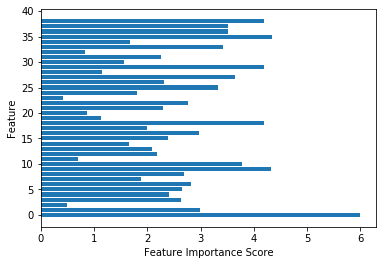

In [47]:
def plot_feature_importances_X(model):
    n_features = X.shape[1]
    plt.barh(range(n_features), model.feature_importances_, align='center')
    plt.yticks=(np.arange(n_features), df.columns)
    plt.xlabel('Feature Importance Score')
    plt.ylabel('Feature')
    
plot_feature_importances_X(ctb)
    

In [66]:
y=pd.DataFrame(y)
y.head()

,default_status
0,0.0
1,0.0
2,1.0
3,0.0
4,0.0


In [147]:
y_not_pay=y.copy()[(y["default_status"]==0.0)]
y_not_pay.rename(columns={'default_status':'y_not_pay'}, inplace=True)
y_not_pay.head()
y_not_pay.shape

(42285, 1)

In [142]:
y_pay=y.copy()[(y['default_status']==1.0)]
y_pay.rename(columns={'default_status':'y_pay'}, inplace=True)
y_pay.head()
y_pay.shape

(13715, 1)

In [43]:
'''for pickle'''
with open ('Mart1rfnow.pickle','wb') as f:
    pickle.dump(ctb, f)

In [47]:
'''we use this cell while testing on new data after we have written pickle'''
'''to read the pickle'''
pickle_in = open('Mart1rfnow.pickle','rb')
'''we renamed classifier here'''
ctb = pickle.load(pickle_in)

In [45]:
#df_sol = pd.DataFrame(ctb.predict(x))#converting prediction to a dataframe
df_sol=ctb.predict_proba(x)[:, 1]
print(df_sol)
print(len(df_sol))
#print(df_sol_proba)

[0.16838516 0.48258375 0.28568059 ... 0.39304259 0.63251598 0.24596293]
24000


In [46]:
df_sample2=df_sample.copy()
df_sample2['default_status']=df_sol
df_sample2.to_csv('Mart1rfnow.csv', index=False) 